<div class="alert alert-block alert-success">
    <h1 align="center">Road Segmentation - Satellite Images</h1>
    <h3 align="center">Image Segmentation</h3>
    
<a href="https://www.kaggle.com/datasets/sanadalali/satellite-images-for-road-segmentation/data">
About Dataset
    </a>
</div>

<img src="https://moonlight-paper-snapshot.s3.ap-northeast-2.amazonaws.com/arxiv/segment-anything-model-for-road-network-graph-extraction-0.png" 
     style="width: 100%; max-width: 1200px; height: 380px; object-fit: cover; display: block; margin: 0 auto; border-radius: 10px;">

<div style="
        background-color:#e6f9e6;
        border-left:6px solid #4caf50;
        padding: 20px;
        border-radius: 8px;
        margin: 20px 0;
        font-size: 16px;
        line-height: 1.6; ">
    <h2 style="text-align: center; color: #007400; margin-top: 0;">
        Welcome to my Notebook...! 
    </h2>
    <p style="text-align: justify; margin-bottom: 20px;">
In this notebook, we focus on the task of road segmentation from satellite images. The goal is to automatically detect and extract roads from high-resolution satellite imagery by classifying each pixel as either road or non-road. Accurate road extraction is important for applications such as urban planning, navigation systems, and map updating.
    </p>
<p style="text-align: justify; margin-bottom: 20px;">
The dataset contains 100 real satellite images of size 400×400 along with their corresponding ground-truth masks. In addition, 1,000 synthetic image-mask pairs of size 416×416 were generated using the pix2pix model to enlarge the training set. The test set consists of 50 satellite images of size 608×608 without any masks. To ensure consistency during training and evaluation, all images and masks are resized to 256×256.
</p>
</div>

<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
        1. Install required libraries
    </p>
</div>

In [1]:
#!pip install -q albumentations

<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
        1.1 Import required libraries
    </p>
</div>

In [2]:
import os, random, math
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
from pathlib import Path
#---
import numpy as np
import cv2 as cv
from PIL import Image
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
#---
from tensorflow import keras
import tensorflow as tf
#---
from sklearn.model_selection import train_test_split
#---
import albumentations as A
#---
import warnings
warnings.filterwarnings('ignore')

#Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
        1.2 Paths & quick inspect
    </p>
</div>

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify; font-weight:bold;">
            <li>
             Overall Dataset Structure
         </li>
        </ul>
</div>

<pre>
Dataset/
│
├── training/
│   │
│   ├── images/
│   │   └── 100 original satellite images
│   │
│   ├── groundtruth/
│   │   └── 100 corresponding ground-truth masks
│   │
│   ├── images_generated/
│   │   └── 1,000+ generated satellite images
│   │
│   └── groundtruth_generated/
│       └── 1,000+ corresponding generated masks
│
└── test/
    │
    ├── test_1/
    │   └── 1 satellite image
    │
    ├── test_2/
    │   └── 1 satellite image
    │
    ├── test_3/
    │   └── 1 satellite image
    │
    ├── ...
    │
    └── test_50/
        └── 1 satellite image
</pre>

In [3]:
# Paths
DATA_ROOT = Path(r'/kaggle/input/datasets/sanadalali/satellite-images-for-road-segmentation' )
train_dir =  DATA_ROOT / 'training'
test_dir  = DATA_ROOT / 'test_set_images'

#--- Train Set
#-- train images and masks
train_images_paths = sorted(glob(f"{train_dir / 'images'}/*.png"))
train_mask_paths  = sorted(glob(f"{train_dir / 'groundtruth'}/*.png"))

#-- train images_generated and masks
train_images_generated_paths = sorted(glob(f"{train_dir / 'images_generated'}/*.png"))
train_masks_generated_paths  = sorted(glob(f"{train_dir / 'groundtruth_generated'}/*.png"))

print(f'Train images Count: {len(train_images_paths)}')
print(f'Train masks Count : {len(train_mask_paths)}')

print(f'Train images_generated Count: {len(train_images_generated_paths)}')
print(f'Train masks_generated Count : {len(train_masks_generated_paths)}')

#--- Test Set
#-- Just Images
test_images_paths = sorted(glob(f"{test_dir}/test_*/test_*.png"))

print(f'Test images Count: {len(test_images_paths)}')

#---
assert len(train_images_paths) == len(train_mask_paths), \
    "Number of training images and masks do not match!"

assert len(train_images_generated_paths) == len(train_masks_generated_paths), \
    "Number of generated images and masks do not match!"


Train images Count: 100
Train masks Count : 100
Train images_generated Count: 1003
Train masks_generated Count : 1003
Test images Count: 50


<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
       2. EDA 
    </p>
</div>


<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Check Images/Masks Shapes:
         </li>
        </ul>
</div>

In [4]:
def images_mask_size(images_paths):
    img = plt.imread(images_paths) 
    return img.shape
    
#Train
train_images_size = [images_mask_size(img) for img in random.sample(train_images_paths, 5)]
train_mask_size = [images_mask_size(img) for img in random.sample(train_mask_paths, 5)]

train_images_generated_size = [images_mask_size(img) for img in random.sample(train_images_generated_paths, 5)]
train_masks_generated_size = [images_mask_size(img) for img in random.sample(train_masks_generated_paths, 5)]

#Test
test_images_size =  [images_mask_size(img) for img in random.sample(test_images_paths, 5)]

print(f'Train Images Size: {train_images_size}')
print(f'Train Masks Size:  {train_mask_size}\n')

print(f'Train Images_Generated Size: {train_images_generated_size}')
print(f'Train Masks_Generated Size:  {train_masks_generated_size}\n')

print(f'Test Images Size: {test_images_size}')

Train Images Size: [(400, 400, 3), (400, 400, 3), (400, 400, 3), (400, 400, 3), (400, 400, 3)]
Train Masks Size:  [(400, 400), (400, 400), (400, 400), (400, 400), (400, 400)]

Train Images_Generated Size: [(416, 416, 3), (416, 416, 3), (416, 416, 3), (416, 416, 3), (416, 416, 3)]
Train Masks_Generated Size:  [(416, 416), (416, 416), (416, 416), (416, 416), (416, 416)]

Test Images Size: [(608, 608, 3), (608, 608, 3), (608, 608, 3), (608, 608, 3), (608, 608, 3)]


<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Road Size Distribution
         </li>
        </ul>
</div>

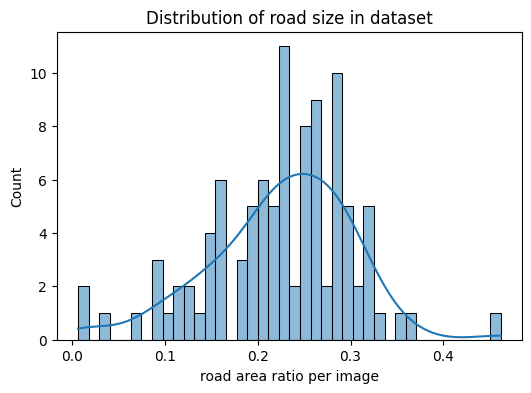

Min road coverage :  0.67%
Mean road coverage: 22.53%
Max road coverage :  46.17%


In [5]:
road_pixels = []
for m in train_mask_paths:  
    mask = np.array(Image.open(m).convert("L"))
    mask_bin = (mask > 0).astype(np.uint8)
    ratio = mask_bin.sum() / mask_bin.size
    road_pixels.append(ratio)

plt.figure(figsize=(6,4))
sns.histplot(road_pixels, bins=40, kde=True)
plt.xlabel("road area ratio per image")
plt.ylabel("Count")
plt.title("Distribution of road size in dataset")
plt.show()
#---
print(f"Min road coverage :  {np.min(road_pixels) * 100:.2f}%")
print(f"Mean road coverage: {np.mean(road_pixels) * 100:.2f}%")
print(f"Max road coverage :  {np.max(road_pixels) * 100:.2f}%")

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Visualization of Sample Dataset Images and Masks 
         </li>
        </ul>
</div>

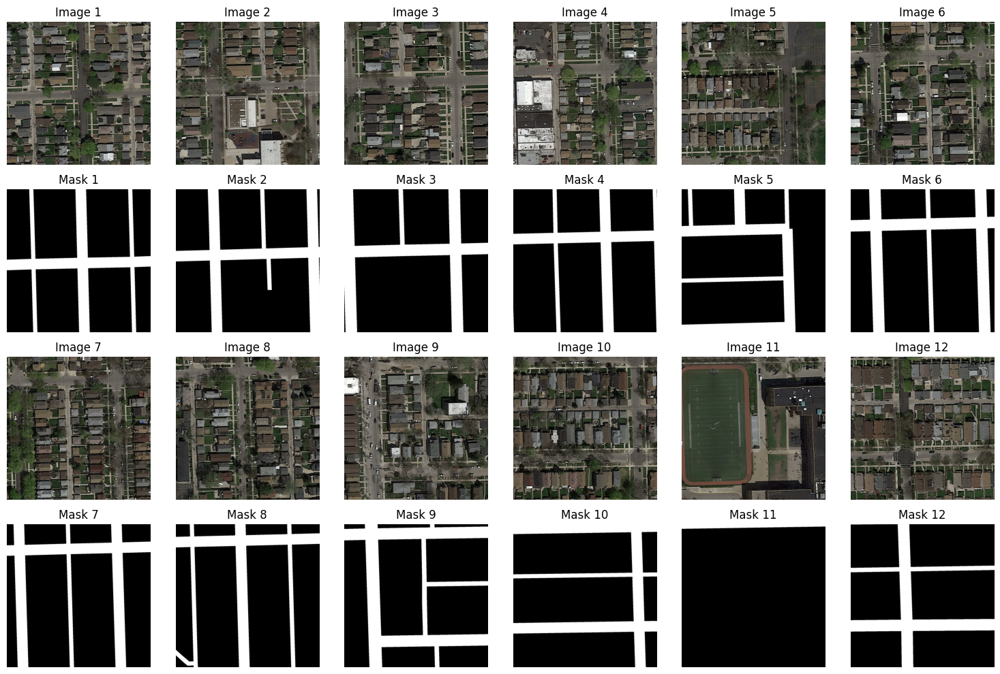

In [6]:
fig, axes = plt.subplots(4, 6, figsize=(15, 10))

for i in range(12):

    # Read image and mask
    image = np.array(Image.open(train_images_paths[i]))
    mask = np.array(Image.open(train_mask_paths[i]).convert("L"))

    # Determine row and column
    if i < 6:
        image_row = 0
        mask_row = 1
        col = i
    else:
        image_row = 2
        mask_row = 3
        col = i - 6

    # Image
    axes[image_row, col].imshow(image)
    axes[image_row, col].set_title(f"Image {i + 1}")
    axes[image_row, col].axis("off")

    # Mask
    axes[mask_row, col].imshow(mask, cmap="gray")
    axes[mask_row, col].set_title(f"Mask {i + 1}")
    axes[mask_row, col].axis("off")

plt.tight_layout()
plt.show()

<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
       3. Data Prepration
    </p>
</div>

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Split Data And Create Datasets
         </li>
        </ul>
</div>


In [7]:
BATCH_SIZE = 32
IMG_SIZE   = (256, 256)
AUTOTUNE = tf.data.AUTOTUNE
#----

#Integrated All Data
all_images = train_images_paths + train_images_generated_paths
all_masks  = train_mask_paths + train_masks_generated_paths

#Create Datasets:
X_train, X_val, y_train, y_val = train_test_split(all_images, all_masks, test_size=0.20, random_state=SEED)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_ds   = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_ds  = tf.data.Dataset.from_tensor_slices(test_images_paths)

I0000 00:00:1788156428.865463     163 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Load image-Mask, Preprocessing And Augmentation Function:
         </li>
        </ul>
</div>

In [8]:
def load_image_mask(image_path, mask_path=None, test=False):

    # Read Image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32) / 255.0

    if test:
        return image

    # Read Mask
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, IMG_SIZE, method='nearest')
    mask = tf.cast(mask > 127, tf.float32)

    return image, mask


# ---
# Data Augmentation

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
])


# ---
# Data Augmentation Function

def augment(image, mask):

    def aug_fn(image, mask):
        data = train_transform(
            image=image.numpy(),
            mask=mask.numpy()
        )

        return data["image"], data["mask"]

    image, mask = tf.py_function(
        aug_fn,
        [image, mask],
        [tf.float32, tf.float32]
    )

    image.set_shape((256, 256, 3))
    mask.set_shape((256, 256, 1))

    return image, mask

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Building tf.data Pipeline with Batching and Prefetching
         </li>
        </ul>
</div>

In [9]:
# Train
train_data = (
    train_ds
    .map(load_image_mask, num_parallel_calls=AUTOTUNE)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE))

# Validation
val_data = (
    val_ds
    .map(load_image_mask, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE))

# Test
test_data = (test_ds.map(lambda image_path: load_image_mask(image_path,test=True),
        num_parallel_calls=AUTOTUNE).batch(BATCH_SIZE).prefetch(AUTOTUNE))
    
print(f"Train batches      : {len(train_data)}")
print(f"Validation batches : {len(val_data)}")
print(f"Test batches       : {len(test_data)}")

Train batches      : 28
Validation batches : 7
Test batches       : 2


<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
       4. Build Model
    </p>
</div>

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Unet Model
         </li>
        </ul>
</div>

In [10]:
INPUT_SHAPE = (256, 256, 3)


def conv_block(x, filters):

    x = keras.layers.Conv2D(filters, 3, padding="same",kernel_initializer="he_normal")(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)

    x = keras.layers.Conv2D(filters, 3, padding="same",kernel_initializer="he_normal")(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)

    return x


def encoder_block(x, filters):

    skip = conv_block(x, filters)
    pool = keras.layers.MaxPooling2D((2, 2))(skip)

    return skip, pool


def decoder_block(x, skip, filters):

    x = keras.layers.Conv2DTranspose(filters, 2, strides=2, padding="same")(x)
    x = keras.layers.Concatenate()([x, skip])
    x = conv_block(x, filters)

    return x


def build_unet(input_shape):

    inputs = keras.layers.Input(shape=input_shape)

    # Encoder
    skip1, pool1 = encoder_block(inputs, 32)
    skip2, pool2 = encoder_block(pool1, 64)
    skip3, pool3 = encoder_block(pool2, 128)
    skip4, pool4 = encoder_block(pool3, 256)

    # Bridge
    bridge = conv_block(pool4, 512)

    # Decoder
    decode1 = decoder_block(bridge, skip4, 256)
    decode2 = decoder_block(decode1, skip3, 128)
    decode3 = decoder_block(decode2, skip2, 64)
    decode4 = decoder_block(decode3, skip1, 32)

    # Output logits
    outputs = keras.layers.Conv2D(1, 1, padding="same")(decode4)

    return keras.Model(inputs,outputs,name="U-Net")


model = build_unet(INPUT_SHAPE)

model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation_2[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]  

 Total params: 7,771,873 (29.65 MB)

 Trainable params: 7,765,985 (29.62 MB)

 Non-trainable params: 5,888 (23.00 KB)

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Loss, Optimizer, Metrics, Callbacks
         </li>
        </ul>
</div>

In [11]:
#Dice Coef Metric
def dice_coef(y_true, y_pred, smooth=1e-6):

    y_pred = tf.sigmoid(y_pred)

    y_true = tf.cast(y_true, tf.float32)

    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true * y_pred)

    dice = (2.0 * intersection + smooth) / (tf.reduce_sum(y_true) +tf.reduce_sum(y_pred) + smooth)

    return dice

#---BCE Loss
loss_fn = keras.losses.BinaryCrossentropy(from_logits=True)

#Optimizer:    
optimizer = keras.optimizers.Adam(learning_rate=1e-4)
    
#CallBakcs:
per_learning = keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1)
    
early = keras.callbacks.EarlyStopping(
        monitor="val_dice_coef",
        mode="max",
        patience=10,
        restore_best_weights=True,
        verbose=1)
    
callbacks = [per_learning, early]

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Model Compilation And Training
         </li>
        </ul>
</div>

In [12]:
#Compile Model:
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=[dice_coef])


#Fit Model:
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=40,
    batch_size=BATCH_SIZE,
    callbacks=callbacks)

Epoch 1/40


I0000 00:00:1788156473.387875     225 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


27/28 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step - dice_coef: 0.3167 - loss: 1.0039

2026-08-31 06:08:10.575285: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-08-31 06:08:10.812455: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_coef: 0.3170 - loss: 1.0009   

2026-08-31 06:08:34.737338: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-08-31 06:08:34.977626: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


28/28 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - dice_coef: 0.3245 - loss: 0.9192 - val_dice_coef: 0.2699 - val_loss: 1.1043 - learning_rate: 1.0000e-04
Epoch 2/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 404ms/step - dice_coef: 0.3247 - loss: 0.6586 - val_dice_coef: 0.2825 - val_loss: 0.7583 - learning_rate: 1.0000e-04
Epoch 3/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 404ms/step - dice_coef: 0.3171 - loss: 0.5534 - val_dice_coef: 0.2908 - val_loss: 0.7169 - learning_rate: 1.0000e-04
Epoch 4/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 401ms/step - dice_coef: 0.3370 - loss: 0.4968 - val_dice_coef: 0.2777 - val_loss: 0.6267 - learning_rate: 1.0000e-04
Epoch 5/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 400ms/step - dice_coef: 0.4030 - loss: 0.4324 - val_dice_coef: 0.2728 - val_loss: 0.5894 - learning_rate: 1.0000e-04
Epoch 6/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 400ms/step - dice_coef: 0.4907 - loss: 0.3644 - val_dice_coef: 0.2652 - val_loss: 0.5695 - learning_rate: 1.0000e-04
Epoch 7/40
28/28 ━━━━━━━━━━━━━━━━━━━━ 12s 413ms/step - dice_

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Training History & Final Metrics Evaluation
         </li>
        </ul>
</div>

Train Loss: 0.07839339226484299
Val Loss: 0.0775117501616478
______________________________
Val Dice Coef: 0.8540229797363281


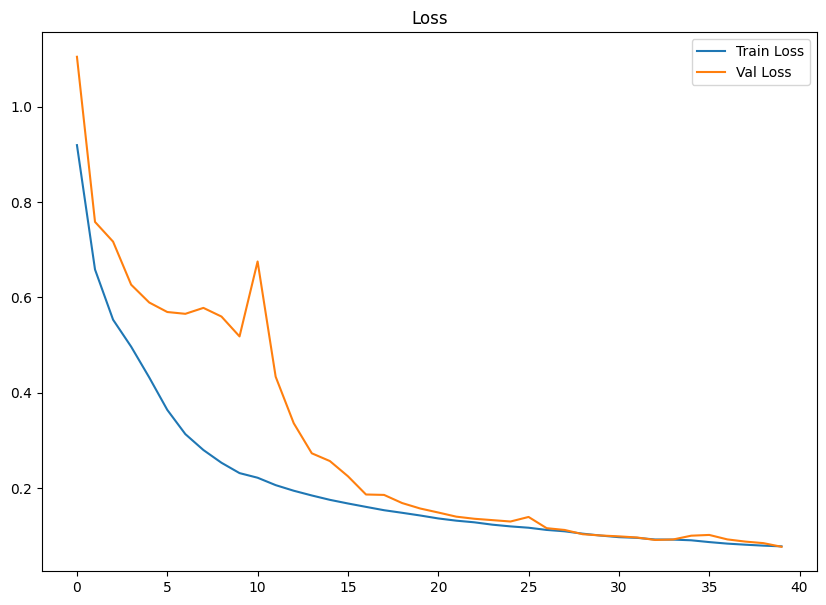

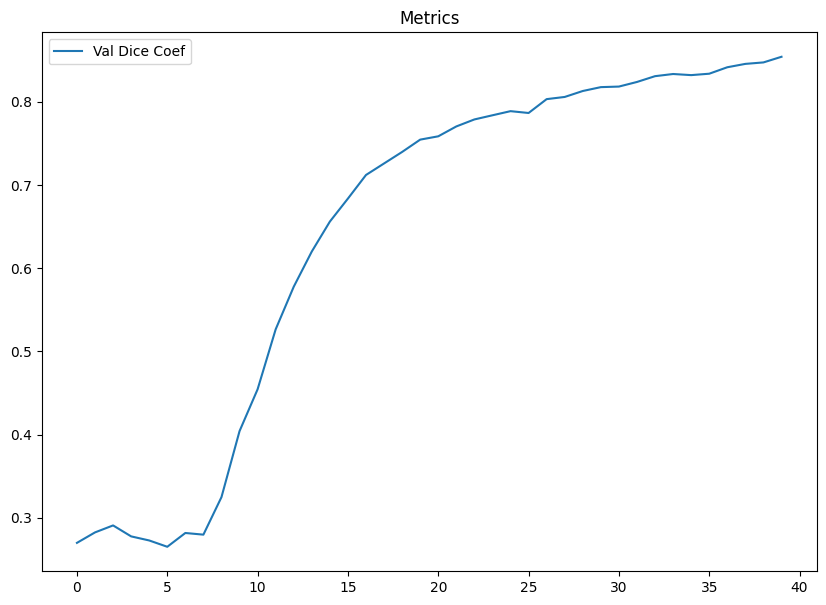

In [13]:
#print(history.history.keys())
print(f'Train Loss: {history.history['loss'][-1]}')
print(f'Val Loss: {history.history['val_loss'][-1]}')
#---
print('_'*30)
print(f'Val Dice Coef: {history.history['val_dice_coef'][-1]}')

#loss
plt.figure(figsize=(10,7))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss')
plt.legend()
plt.show()

#IOU - Dice 
plt.figure(figsize=(10,7))
plt.plot(history.history['val_dice_coef'], label='Val Dice Coef')
plt.title('Metrics')
plt.legend()
plt.show()

<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
       5. Visual Evaluation of Model Predictions
    </p>
</div>

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Visualization Model Predictions on Validation Set
         </li>
        </ul>
</div>

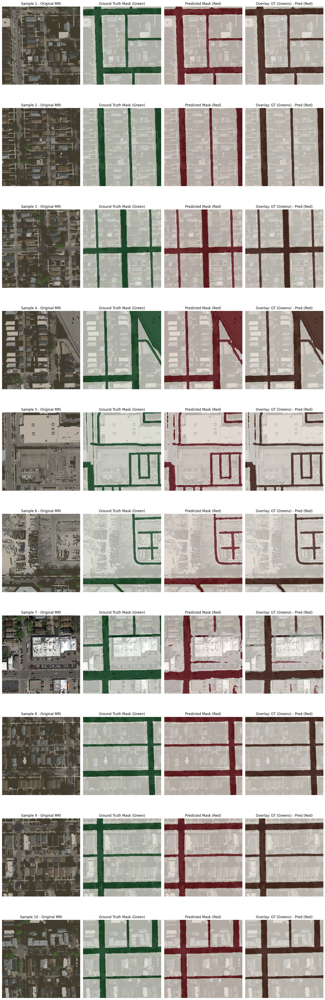

In [14]:
#---Visualization Function
def visualize_predictions(model, dataset, num_samples=10):
    plt.figure(figsize=(16, 5*num_samples))
    
    for i, (image, mask_true) in enumerate(dataset.unbatch().take(num_samples)):

        pred = model.predict(tf.expand_dims(image, axis=0), verbose=0)[0]
        pred = tf.sigmoid(pred).numpy() > 0.5   
        pred = pred.squeeze()                   
        
        image_np = image.numpy()
        mask_true_np = mask_true.numpy().squeeze()
        
        #---Row Plot
        plt.subplot(num_samples, 4, i*4 + 1)
        plt.imshow(image_np)
        plt.title(f"Sample {i+1} - Original MRI")
        plt.axis('off')
        
        # Ground Truth Mask
        plt.subplot(num_samples, 4, i*4 + 2)
        plt.imshow(image_np)
        plt.imshow(mask_true_np, cmap='Greens', alpha=0.6)
        plt.title("Ground Truth Mask (Green)")
        plt.axis('off')
        
        # Prediction Mask
        plt.subplot(num_samples, 4, i*4 + 3)
        plt.imshow(image_np)
        plt.imshow(pred, cmap='Reds', alpha=0.6)
        plt.title("Predicted Mask (Red)")
        plt.axis('off')
        
        # Overlay Both Masks
        plt.subplot(num_samples, 4, i*4 + 4)
        plt.imshow(image_np)
        plt.imshow(mask_true_np, cmap='Greens', alpha=0.4)   
        plt.imshow(pred, cmap='Reds', alpha=0.4)            
        plt.title("Overlay: GT (Greens) - Pred (Red)")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
#---

visualize_predictions(model, val_data, num_samples=10)

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Visualization Model Predictions on Test Set
         </li>
        </ul>
</div>

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


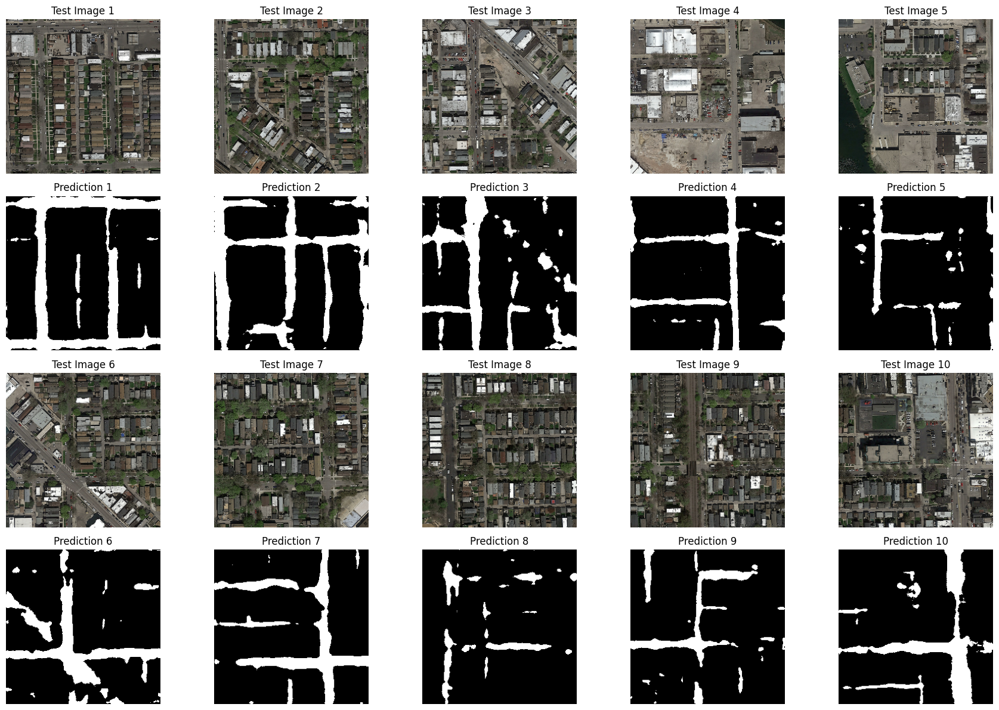

In [17]:
test_images = next(iter(test_data))

predictions = model.predict(test_images)

predictions = tf.sigmoid(predictions)
binary_predictions = tf.cast(predictions > 0.5, tf.float32)


# Display 10 test samples
fig, axes = plt.subplots(4, 5, figsize=(18, 12))

for i in range(10):

    # Row for image
    row_img = i // 5 * 2
    col = i % 5

    axes[row_img, col].imshow(test_images[i])
    axes[row_img, col].axis("off")
    axes[row_img, col].set_title(f"Test Image {i+1}")

    # Row for mask
    axes[row_img + 1, col].imshow(
        binary_predictions[i].numpy().squeeze(),
        cmap="gray"
    )
    axes[row_img + 1, col].axis("off")
    axes[row_img + 1, col].set_title(f"Prediction {i+1}")

plt.tight_layout()
plt.show()

<div style="
    background-color:#FFFFDD;
    border-left:6px solid #FFFE00;
    padding:15px 20px;
    border-radius:8px;
    margin:15px 0;
    font-size:14px;
    line-height:1.5;
">
        <ul style="margin: 0; padding-left: 20px; text-align: justify;font-weight:bold;">
            <li>
             Threshold Optimization using Dice Score
         </li>
        </ul>
</div>

In [16]:
y_true = []
y_pred = []

for images, masks in val_data:
    y_true.append(masks.numpy())
    y_pred.append(model.predict(images, verbose=0))

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)
y_pred = tf.sigmoid(y_pred).numpy()

#---

def dice_at_threshold(y_true, y_pred, threshold):

    y_pred = (y_pred > threshold).astype(np.float32)

    intersection = np.sum(y_true * y_pred)
    dice = (2 * intersection + 1e-6) / (
        np.sum(y_true) + np.sum(y_pred) + 1e-6)
    
    return dice
#---

for threshold in [0.5, 0.6, 0.7, 0.8, 0.9]:

    dice = dice_at_threshold(y_true, y_pred, threshold)
    print(f"Threshold: {threshold:.1f}  →  Dice: {dice:.4f}")

Threshold: 0.5  →  Dice: 0.9681
Threshold: 0.6  →  Dice: 0.9656
Threshold: 0.7  →  Dice: 0.9603
Threshold: 0.8  →  Dice: 0.9510
Threshold: 0.9  →  Dice: 0.9318


<div style="background-color:#e6f9e6;border-left:6px solid #4caf50;padding:15px 20px;border-radius:8px;margin:15px 0;font-size:16px;line-height:1.5;">
    <p style="font-weight:bold;margin-bottom:10px;">
       Thanks a lot for going through this notebook! I hope it was helpful and worth your time.
    </p>
</div>